# Notable Observations: What makes them notable?

 According to the eBird API documentation, notable observations can be for locally or nationally rare species or are otherwise unusual, e.g. over-wintering birds in a species which is normally only a summer visitor.


#### Citation: eBird Basic Dataset. Version: EBD_relAug-2020. Cornell Lab of Ornithology, Ithaca, New York. Aug 2020.

In [1]:
# import dependencies
import os, csv, requests, json, datetime
import pandas as pd
import numpy as np
import plotly.express as px
from config import api_key, mapbox_token, g_key
from datetime import date

%reload_ext lab_black

px.set_mapbox_access_token(mapbox_token)

<img src="./Resources/Calliope_Range_Map.png" alt="RANGE MAP: Calliope Hummingbird, https://doi.org/10.2173/bow.calhum.01" style="border: 1px solid darkgray" align="left" width="400px">

<span style="color:white">
<h1 align="center">Notable Observations in Texas</h3>
<h3 align="center">Calliope Hummingbird, Selasphorus calliope</h3>
    
Some range maps for the Calliope Hummingbird extend the Fall Migration zone further east in Texas, but the majority limit the range to west Texas or even far west Texas.  The fall migration south is underway as the Calliope make their way to their wintering grounds in the pine oak forests of Mexico.
    

#### Interesting facts (from WhatBird.com):
    
The Calliope Hummingbird is the smallest bird in the United States, yet it travels more than 5,000 miles from the mountains of the northwest to Mexico and back.

The Calliope Hummingbird is the smallest breeding bird in North America and the smallest long-distance avian migrant in the world.

It prefers high mountains, and has been seen as high as 11,000 feet.
        
A group of hummingbirds has many collective nouns, including a “bouquet", "glittering", "hover", "shimmer", and "tune” of hummingbirds.
    
###### <blockquote>Image citation: Calder, W. A. and L. L. Calder (2020). Calliope Hummingbird (Selasphorus calliope), version 1.0. In Birds of the World (A. F. Poole and F. B. Gill, Editors). Cornell Lab of Ornithology, Ithaca, NY, USA. https://doi.org/10.2173/bow.calhum.01</blockquote>

A | B
- | - 
![alt](Resources/Calliope_1.jpg) | ![alt](Resources/Calliope_2.jpg)

In [ ]:
<table><tr><td><img src='img1'></td><td><img src='img2'></td></tr></table>

In [2]:
## Import sound dependencies
from IPython.display import Audio, display


def calliope_call():
    display(
        Audio(
            url="https://www.allaboutbirds.org/guide/assets/sound/535904.mp3",
            autoplay=True,
        )
    )


calliope_call()

# START - TEXAS

In [3]:
today = date.today()
days_back_short = 3
days_back_long = 30

In [4]:
# ALL notable observations in Texas
regionCode = "US-TX"

url_notables = (
    "https://api.ebird.org/v2/data/obs/"
    + regionCode
    + "/recent/notable?back=30"  # max number of days back for observations = 30
)

r_notables = requests.get(
    url_notables, params={"key": api_key, "back": days_back_long, "detail": "full"}
)

In [5]:
r_notables.status_code

200

In [6]:
r_notables.url

'https://api.ebird.org/v2/data/obs/US-TX/recent/notable?back=30&key=d56mdhi9b35r&back=30&detail=full'

### Texas Notable Observations Dataframe

In [7]:
df_notables = pd.DataFrame(r_notables.json())

In [8]:
pd.to_datetime(df_notables["obsDt"])
df_notables["Year"] = pd.DatetimeIndex(df_notables["obsDt"]).year
df_notables["Month"] = pd.DatetimeIndex(df_notables["obsDt"]).month
df_notables["Day"] = pd.DatetimeIndex(df_notables["obsDt"]).day

In [9]:
df_notables.columns  # Pulled in the detailed dataset to pick which columns I wanted to keep and rename.

Index(['speciesCode', 'comName', 'sciName', 'locId', 'locName', 'obsDt',
       'howMany', 'lat', 'lng', 'obsValid', 'obsReviewed', 'locationPrivate',
       'subId', 'subnational2Code', 'subnational2Name', 'subnational1Code',
       'subnational1Name', 'countryCode', 'countryName', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'firstName',
       'lastName', 'hasRichMedia', 'evidence', 'Year', 'Month', 'Day'],
      dtype='object')

In [10]:
df_notables.drop(
    columns=[
        "locId",
        "locName",
        "obsValid",
        "obsReviewed",
        "locationPrivate",
        "userDisplayName",
        "presenceNoted",
        "hasComments",
        "evidence",
        "firstName",
        "lastName",
        "hasRichMedia",
    ]
)

,speciesCode,comName,sciName,obsDt,howMany,lat,lng,subId,subnational2Code,subnational2Name,subnational1Code,subnational1Name,countryCode,countryName,obsId,checklistId,Year,Month,Day
0,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:31,1.0,30.618894,-103.982375,S74293801,US-TX-243,Jeff Davis,US-TX,Texas,US,United States,OBS989467781,CL23634,2020,10,1
1,pisjun,Dark-eyed Junco (Pink-sided),Junco hyemalis,2020-10-01 16:31,1.0,30.618894,-103.982375,S74293801,US-TX-243,Jeff Davis,US-TX,Texas,US,United States,OBS989467780,CL23634,2020,10,1
2,lazbun,Lazuli Bunting,Passerina amoena,2020-10-01 16:31,1.0,30.618894,-103.982375,S74293801,US-TX-243,Jeff Davis,US-TX,Texas,US,United States,OBS989467787,CL23634,2020,10,1
3,lewwoo,Lewis's Woodpecker,Melanerpes lewis,2020-10-01 16:11,1.0,34.403024,-103.042971,S74294242,US-TX-369,Parmer,US-TX,Texas,US,United States,OBS989472328,CL23457,2020,10,1
4,purgal2,Purple Gallinule,Porphyrio martinica,2020-10-01 16:04,1.0,28.800573,-96.460455,S74293456,US-TX-239,Jackson,US-TX,Texas,US,United States,OBS989463840,CL24866,2020,10,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3864,trokin,Tropical Kingbird,Tyrannus melancholicus,2020-09-02 06:45,4.0,31.753861,-106.404691,S73127727,US-TX-141,El Paso,US-TX,Texas,US,United States,OBS975794939,CL24636,2020,9,2
3865,trokin,Tropical Kingbird,Tyrannus melancholicus,2020-09-02 06:45,4.0,31.753861,-106.404691,S73127727,US-TX-141,El Paso,US-TX,Texas,US,United States,OBS975794939,CL24636,2020,9,2
3866,wilsni1,Wilson's Snipe,Gallinago delicata,2020-09-02 06:45,3.0,28.893802,-95.581999,S73153345,US-TX-039,Brazoria,US-TX,Texas,US,United States,OBS976071499,CL22320,2020,9,2
3867,wilsni1,Wilson's Snipe,Gallinago delicata,2020-09-02 06:45,3.0,28.893802,-95.581999,S73153345,US-TX-039,Brazoria,US-TX,Texas,US,United States,OBS976071499,CL22320,2020,9,2


In [11]:
columns_dict = {
    "speciesCode": "Species_Code",
    "comName": "Common_Name",
    "sciName": "Scientific_Name",
    "obsDt": "Date",
    "howMany": "Bird_Count",
    "subnational2Code": "City_Code",
    "subnational2Name": "City_Name",
    "subnational1Code": "State_Code",
    "subnational1Name": "State_Name",
    "countryCode": "Country_Code",
    "countryName": "Country_Name",
}

df_notables = df_notables.rename(columns=columns_dict)

In [12]:
df_notables.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'City_Code', 'City_Name', 'State_Code',
       'State_Name', 'Country_Code', 'Country_Name', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'firstName',
       'lastName', 'hasRichMedia', 'evidence', 'Year', 'Month', 'Day'],
      dtype='object')

In [13]:
df_notables["Bird_Count"].fillna(value=1, inplace=True)

In [14]:
df_notables.to_csv("Resources/TX_NotableObs_eBird.csv", index=False)

In [15]:
TX_NOTABLE_OBS = os.path.join("Resources", "TX_NotableObs_eBird.csv")
TX_NOTABLE_OBS_df = pd.read_csv(TX_NOTABLE_OBS)

In [16]:
# TX_NOTABLE_OBS_df["Notable_Normal"] = 2
TX_NOTABLE_OBS_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'City_Code', 'City_Name', 'State_Code',
       'State_Name', 'Country_Code', 'Country_Name', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'firstName',
       'lastName', 'hasRichMedia', 'evidence', 'Year', 'Month', 'Day'],
      dtype='object')

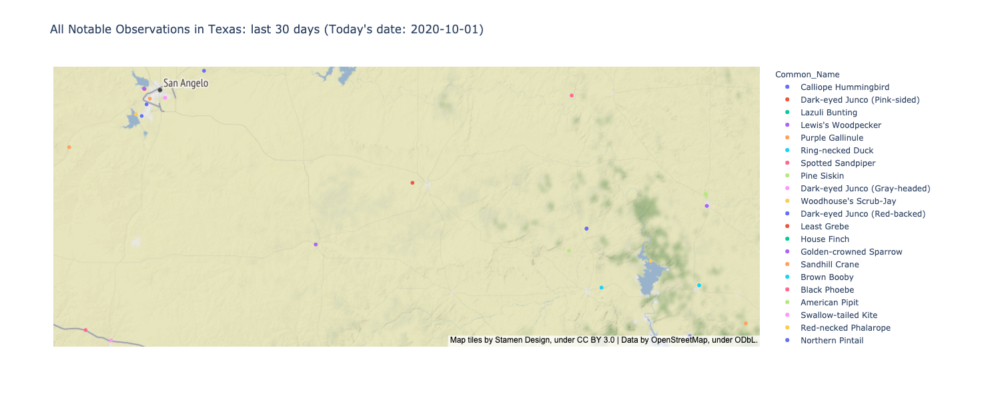

In [17]:
# mapbox_style options:
#     'open-street-map'`,
#     `'white-bg'`, `'carto-positron'`, `'carto-darkmatter'`, `'stamen-
#     terrain'`, `'stamen-toner'`, `'stamen-watercolor'`. Allowed values
#     which do require a Mapbox API token are `'basic'`, `'streets'`,
#     `'outdoors'`, `'light'`, `'dark'`, `'satellite'`, `'satellite-
#     streets'`

fig_TX_NOTABLE_OBS_df = px.scatter_mapbox(
    TX_NOTABLE_OBS_df,
    lat="lat",
    lon="lng",
    color="Common_Name",
    #     size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Bird_Count", "Date"],
    title=f"All Notable Observations in Texas: last {days_back_long} days (Today's date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=600,
)
fig_TX_NOTABLE_OBS_df.show()

### Citation: eBird Basic Dataset. Version: EBD_relAug-2020. Cornell Lab of Ornithology, Ithaca, New York. Aug 2020.

In [18]:
TX_NOTABLE_OBS_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'City_Code', 'City_Name', 'State_Code',
       'State_Name', 'Country_Code', 'Country_Name', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'firstName',
       'lastName', 'hasRichMedia', 'evidence', 'Year', 'Month', 'Day'],
      dtype='object')

In [19]:
# TX_NOTABLE_OBS_df.loc[TX_NOTABLE_OBS_df["Common_Name"] == "Calliope Hummingbird"]
# TX_NOTABLE_OBS_df.loc[TX_NOTABLE_OBS_df["Common_Name"] == species]
test_df = TX_NOTABLE_OBS_df[
    ["locId", "Date", "subId", "lat", "lng", "firstName", "lastName"]
]


,locId,Date,subId,lat,lng,firstName,lastName
0,L7330904,2020-10-01 16:31,S74293801,30.618894,-103.982375,D.D.,Currie cc
1,L7330904,2020-10-01 16:31,S74293801,30.618894,-103.982375,D.D.,Currie cc
2,L7330904,2020-10-01 16:31,S74293801,30.618894,-103.982375,D.D.,Currie cc
3,L894439,2020-10-01 16:11,S74294242,34.403024,-103.042971,Moses,Michelsohn
4,L6953560,2020-10-01 16:04,S74293456,28.800573,-96.460455,Tira,Overstreet
...,...,...,...,...,...,...,...
3864,L797450,2020-09-02 06:45,S73127727,31.753861,-106.404691,John,Kiseda
3865,L797450,2020-09-02 06:45,S73127727,31.753861,-106.404691,John,Kiseda
3866,L248858,2020-09-02 06:45,S73153345,28.893802,-95.581999,Wendy,McCrady
3867,L248858,2020-09-02 06:45,S73153345,28.893802,-95.581999,Wendy,McCrady


In [68]:
test_df.drop_duplicates(inplace=True)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [69]:
test_df.loc[test_df["subId"] == "S74293801"]

,locId,Date,subId,lat,lng,firstName,lastName
0,L7330904,2020-10-01 16:31,S74293801,30.618894,-103.982375,D.D.,Currie cc


In [20]:
name_count = TX_NOTABLE_OBS_df["Common_Name"].value_counts()
name_count_df = name_count.to_frame()
name_count_df

,Common_Name
Calliope Hummingbird,155
Red-necked Phalarope,113
Sabine's Gull,107
Rufous Hummingbird,86
Costa's Hummingbird,86
...,...
Eastern Bluebird (Eastern),1
Blue-winged Warbler,1
Brown-headed Nuthatch (Southeast),1
Rivoli's Hummingbird,1


In [21]:
species = name_count_df["Common_Name"].idxmax()
species

'Calliope Hummingbird'

In [22]:
TX_species_df = TX_NOTABLE_OBS_df.loc[TX_NOTABLE_OBS_df["Common_Name"] == species]
TX_species_df = TX_species_df.reset_index().drop(columns="index")
TX_species_df["Notable_Normal"] = 2
TX_species_df.head(1)

,Species_Code,Common_Name,Scientific_Name,locId,locName,Date,Bird_Count,lat,lng,obsValid,...,presenceNoted,hasComments,firstName,lastName,hasRichMedia,evidence,Year,Month,Day,Notable_Normal
0,calhum,Calliope Hummingbird,Selasphorus calliope,L7330904,DDD Olds Creek Dr,2020-10-01 16:31,1.0,30.618894,-103.982375,False,...,False,False,D.D.,Currie cc,False,NaN,2020,10,1,2


In [23]:
TX_species_df.to_csv("Resources/TX_Species_Obs_eBird.csv", index=False)

In [24]:
TX_SPECIES_OBS = os.path.join("Resources", "TX_Species_Obs_eBird.csv")
TX_SPECIES_OBS_df = pd.read_csv(TX_SPECIES_OBS)

### CALLIOPE TAXONOMY

In [25]:
TX_species_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'City_Code', 'City_Name', 'State_Code',
       'State_Name', 'Country_Code', 'Country_Name', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'firstName',
       'lastName', 'hasRichMedia', 'evidence', 'Year', 'Month', 'Day',
       'Notable_Normal'],
      dtype='object')

In [26]:
TX_species_df["Species_Code"][0]

'calhum'

In [27]:
species_code = TX_species_df["Species_Code"][0]

In [28]:
# Get the taxonomy for the most common observed species
url_species_taxonomy = "https://api.ebird.org/v2/ref/taxonomy/ebird"

r_species_taxonomy = requests.get(
    url_species_taxonomy,
    params={"key": api_key, "fmt": "json", "species": species_code},
)

In [29]:
r_species_taxonomy.json()

[{'sciName': 'Selasphorus calliope',
  'comName': 'Calliope Hummingbird',
  'speciesCode': 'calhum',
  'category': 'species',
  'taxonOrder': 4691.0,
  'bandingCodes': ['CAHU'],
  'comNameCodes': [],
  'sciNameCodes': ['SECA'],
  'order': 'Caprimulgiformes',
  'familyComName': 'Hummingbirds',
  'familySciName': 'Trochilidae'}]

In [30]:
species_taxonomy_df = pd.DataFrame(r_species_taxonomy.json())
species_taxonomy_df

,sciName,comName,speciesCode,category,taxonOrder,bandingCodes,comNameCodes,sciNameCodes,order,familyComName,familySciName
0,Selasphorus calliope,Calliope Hummingbird,calhum,species,4691.0,[CAHU],[],[SECA],Caprimulgiformes,Hummingbirds,Trochilidae


In [31]:
species_taxonomy_df = species_taxonomy_df.rename(
    columns={
        "order": "Order",
        "familySciName": "Family_Name",
        "comName": "Common_Name",
        "sciName": "Scientific_Name",
    }
)

In [32]:
species_taxonomy_df

,Scientific_Name,Common_Name,speciesCode,category,taxonOrder,bandingCodes,comNameCodes,sciNameCodes,Order,familyComName,Family_Name
0,Selasphorus calliope,Calliope Hummingbird,calhum,species,4691.0,[CAHU],[],[SECA],Caprimulgiformes,Hummingbirds,Trochilidae


In [33]:
species_taxonomy_df.to_csv("Resources/Species_Taxonomy.csv", index=False)

In [34]:
species_taxonomy_df["Family_Name"][0]

'Trochilidae'

In [35]:
TX_species_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'City_Code', 'City_Name', 'State_Code',
       'State_Name', 'Country_Code', 'Country_Name', 'userDisplayName',
       'obsId', 'checklistId', 'presenceNoted', 'hasComments', 'firstName',
       'lastName', 'hasRichMedia', 'evidence', 'Year', 'Month', 'Day',
       'Notable_Normal'],
      dtype='object')

In [36]:
species_family_name = species_taxonomy_df["Family_Name"][0]

In [37]:
TX_species_df = TX_species_df.assign(Family_Name=species_family_name)

In [38]:
TX_species_df

,Species_Code,Common_Name,Scientific_Name,locId,locName,Date,Bird_Count,lat,lng,obsValid,...,hasComments,firstName,lastName,hasRichMedia,evidence,Year,Month,Day,Notable_Normal,Family_Name
0,calhum,Calliope Hummingbird,Selasphorus calliope,L7330904,DDD Olds Creek Dr,2020-10-01 16:31,1.0,30.618894,-103.982375,False,...,False,D.D.,Currie cc,False,NaN,2020,10,1,2,Trochilidae
1,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-09-26 16:15,1.0,29.577220,-95.677732,True,...,False,Jean,Greenhalgh,False,NaN,2020,9,26,2,Trochilidae
2,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-09-26 15:36,1.0,29.577220,-95.677732,True,...,False,Mark,Scheuerman,False,NaN,2020,9,26,2,Trochilidae
3,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-09-26 13:10,1.0,29.577220,-95.677732,True,...,False,Tony,Frank,False,NaN,2020,9,26,2,Trochilidae
4,calhum,Calliope Hummingbird,Selasphorus calliope,L839995,Riverpark Nature Trails (Sugar Land),2020-09-26 09:30,1.0,29.577220,-95.677732,True,...,False,Mark,Scheuerman,False,NaN,2020,9,26,2,Trochilidae
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,calhum,Calliope Hummingbird,Selasphorus calliope,L12226592,"1505 Crestwood Rd, Austin US-TX (Private Resid...",2020-09-05 14:09,1.0,30.297931,-97.711237,True,...,False,Caleb,Helsel,True,P,2020,9,5,2,Trochilidae
151,calhum,Calliope Hummingbird,Selasphorus calliope,L12225501,"1000 E Railroad Ave, Fort Stockton US-TX 30.89...",2020-09-05 13:21,1.0,30.894155,-102.878718,False,...,False,Greg,Duncan,False,NaN,2020,9,5,2,Trochilidae
152,calhum,Calliope Hummingbird,Selasphorus calliope,L12237021,"1000 E Railroad Ave, Fort Stockton US-TX 30.89...",2020-09-05 13:05,1.0,30.893549,-102.878588,False,...,False,Ted,Zobeck,False,NaN,2020,9,5,2,Trochilidae
153,calhum,Calliope Hummingbird,Selasphorus calliope,L5814772,"Palko Home, 5505 Hillcrest, Midland, Tx. 79707",2020-09-04 15:18,1.0,32.002966,-102.159163,True,...,False,Greg,Palko,True,P,2020,9,4,2,Trochilidae


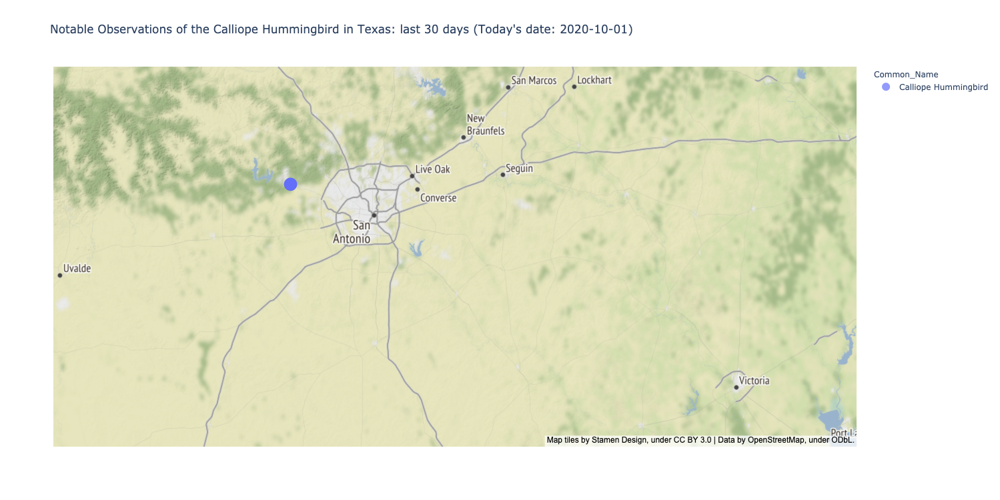

In [39]:
# Maps with plotly

fig_TX_species_df = px.scatter_mapbox(
    TX_species_df,
    lat="lat",
    lon="lng",
    color="Common_Name",
    size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Common_Name", "Family_Name", "Bird_Count", "Date"],
    title=f"Notable Observations of the {species} in Texas: last {days_back_long} days (Today's date: {today})",
    mapbox_style="stamen-terrain",
    width=1100,
    height=750,
)
fig_TX_species_df.show()

# START - US

### Calliope across the US - normal observations

In [40]:
# Get data for specified species observations across the US

regionCodeUS = "US"

url_US_species = (
    f"https://api.ebird.org/v2/data/obs/" + regionCodeUS + "/recent/" + species_code
)

r_US_species = requests.get(
    url_US_species, params={"key": api_key, "back": days_back_long}
)

In [41]:
r_US_species.status_code

200

In [42]:
US_species_df = pd.DataFrame(r_US_species.json())

In [43]:
US_species_df["howMany"].fillna(value=1, inplace=True)

In [44]:
US_species_df["Notable_Normal"] = 1
US_species_df

,speciesCode,comName,sciName,locId,locName,obsDt,howMany,lat,lng,obsValid,obsReviewed,locationPrivate,subId,Notable_Normal
0,calhum,Calliope Hummingbird,Selasphorus calliope,L11047160,Home list,2020-10-01 06:37,1.0,31.417106,-110.245284,True,False,True,S74276679,1
1,calhum,Calliope Hummingbird,Selasphorus calliope,L7988742,Tom's Backyard,2020-09-30 18:12,2.0,32.371215,-106.769178,True,True,True,S74262129,1
2,calhum,Calliope Hummingbird,Selasphorus calliope,L2883481,The Ice House,2020-09-30 17:38,1.0,31.492044,-110.990056,True,False,True,S74261962,1
3,calhum,Calliope Hummingbird,Selasphorus calliope,L129060,Portal,2020-09-30 17:27,2.0,31.913601,-109.140800,True,False,False,S74262487,1
4,calhum,Calliope Hummingbird,Selasphorus calliope,L583547,Davis Mountains Resort (Restricted Access),2020-09-30 15:27,1.0,30.617380,-104.097004,True,False,False,S74264939,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486,calhum,Calliope Hummingbird,Selasphorus calliope,L1285882,Los Poblanos Open Space,2020-09-02 07:00,1.0,35.145179,-106.657033,True,False,False,S73103153,1
487,calhum,Calliope Hummingbird,Selasphorus calliope,L3565964,MPG Ranch--Clubhouse Floodplain (restricted ac...,2020-09-02 06:31,1.0,46.692990,-114.044716,True,False,False,S73103540,1
488,calhum,Calliope Hummingbird,Selasphorus calliope,L12243228,Sequoia-Kings Canyon Wilderness--Crabtree Lakes,2020-09-02 06:25,1.0,36.546518,-118.327427,True,False,True,S73312736,1
489,calhum,Calliope Hummingbird,Selasphorus calliope,L11062523,Stremciuc Residence at the Highlands US-AZ,2020-09-02 06:09,1.0,33.661277,-112.201222,True,True,True,S73099051,1


In [45]:
US_species_columns_dict = {
    "speciesCode": "Species_Code",
    "comName": "Common_Name",
    "sciName": "Scientific_Name",
    "obsDt": "Date",
    "howMany": "Bird_Count",
}

US_species_df = US_species_df.rename(columns=US_species_columns_dict)

In [46]:
pd.to_datetime(US_species_df["Date"])
US_species_df["Year"] = pd.DatetimeIndex(US_species_df["Date"]).year
US_species_df["Month"] = pd.DatetimeIndex(US_species_df["Date"]).month
US_species_df["Day"] = pd.DatetimeIndex(US_species_df["Date"]).day
US_species_df = US_species_df.assign(Family_Name=species_family_name)

In [47]:
US_species_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'locId', 'locName',
       'Date', 'Bird_Count', 'lat', 'lng', 'obsValid', 'obsReviewed',
       'locationPrivate', 'subId', 'Notable_Normal', 'Year', 'Month', 'Day',
       'Family_Name'],
      dtype='object')

In [48]:
US_species_df = US_species_df.drop(
    columns=["locId", "locName", "obsValid", "obsReviewed", "locationPrivate"]
)
US_species_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'Date', 'Bird_Count',
       'lat', 'lng', 'subId', 'Notable_Normal', 'Year', 'Month', 'Day',
       'Family_Name'],
      dtype='object')

In [49]:
US_species_df.to_csv("Resources/US_Species_Obs_eBird.csv", index=False)

In [50]:
US_SPECIES_OBS = os.path.join("Resources", "US_Species_Obs_eBird.csv")
US_SPECIES_OBS_df = pd.read_csv(US_SPECIES_OBS)
US_SPECIES_OBS_df

,Species_Code,Common_Name,Scientific_Name,Date,Bird_Count,lat,lng,subId,Notable_Normal,Year,Month,Day,Family_Name
0,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 06:37,1.0,31.417106,-110.245284,S74276679,1,2020,10,1,Trochilidae
1,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 18:12,2.0,32.371215,-106.769178,S74262129,1,2020,9,30,Trochilidae
2,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 17:38,1.0,31.492044,-110.990056,S74261962,1,2020,9,30,Trochilidae
3,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 17:27,2.0,31.913601,-109.140800,S74262487,1,2020,9,30,Trochilidae
4,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-30 15:27,1.0,30.617380,-104.097004,S74264939,1,2020,9,30,Trochilidae
...,...,...,...,...,...,...,...,...,...,...,...,...,...
486,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-02 07:00,1.0,35.145179,-106.657033,S73103153,1,2020,9,2,Trochilidae
487,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-02 06:31,1.0,46.692990,-114.044716,S73103540,1,2020,9,2,Trochilidae
488,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-02 06:25,1.0,36.546518,-118.327427,S73312736,1,2020,9,2,Trochilidae
489,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-02 06:09,1.0,33.661277,-112.201222,S73099051,1,2020,9,2,Trochilidae


In [51]:
TX_SPECIES_OBS_df = TX_species_df.drop(
    columns=[
        "locId",
        "locName",
        "obsValid",
        "obsReviewed",
        "locationPrivate",
        "City_Code",
        "City_Name",
        "State_Code",
        "State_Name",
        "Country_Code",
        "Country_Name",
        "userDisplayName",
        "obsId",
        "checklistId",
        "presenceNoted",
        "hasComments",
        "firstName",
        "lastName",
        "hasRichMedia",
        "evidence",
    ]
)

In [52]:
TX_SPECIES_OBS_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'Date', 'Bird_Count',
       'lat', 'lng', 'subId', 'Year', 'Month', 'Day', 'Notable_Normal',
       'Family_Name'],
      dtype='object')

In [53]:
US_SPECIES_OBS_df.columns

Index(['Species_Code', 'Common_Name', 'Scientific_Name', 'Date', 'Bird_Count',
       'lat', 'lng', 'subId', 'Notable_Normal', 'Year', 'Month', 'Day',
       'Family_Name'],
      dtype='object')

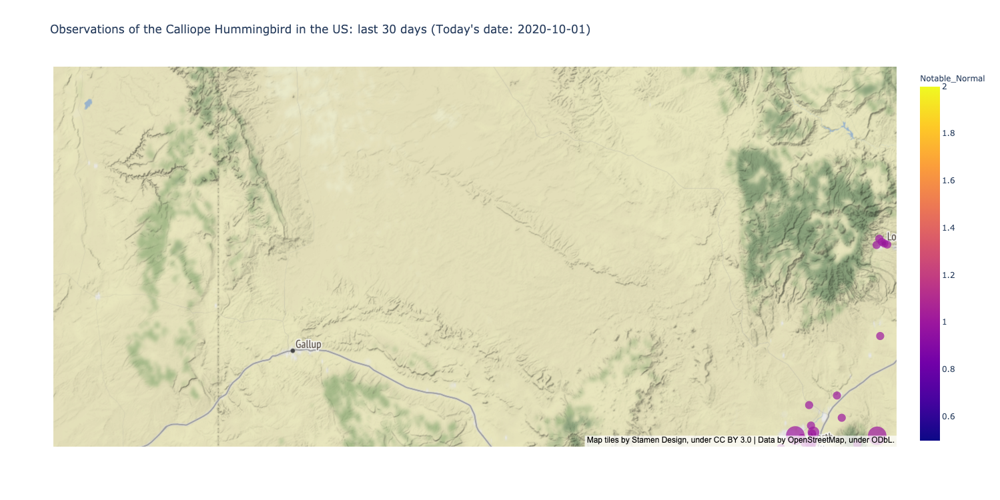

In [54]:
# species_plot = df_species_US.loc[df_species_US["comName"] == f"{species}"]

# Covering US for full 30 days and especially for a single species won't work because you're limited to requesting maximum 10k records. Could miss out on a large portion of data.

# US_SPECIES_OBS_df["Notable_Normal"] = US_SPECIES_OBS_df["Notable_Normal"].astype(int)
# TX_SPECIES_OBS_df["Notable_Normal"] = TX_SPECIES_OBS_df["Notable_Normal"].astype(int)

fig_US_SPECIES_OBS_df = px.scatter_mapbox(
    US_SPECIES_OBS_df,
    lat="lat",
    lon="lng",
    color="Notable_Normal",
    #     color_discrete_sequence="#0000FF",
    size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Scientific_Name", "Family_Name", "Bird_Count", "Date"],
    title=f"Observations of the {species} in the US: last {days_back_long} days (Today's date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=750,
)

fig_US_SPECIES_OBS_df.add_trace(
    px.scatter_mapbox(
        TX_SPECIES_OBS_df,
        lat="lat",
        lon="lng",
        color="Notable_Normal",
        #         color_discrete_sequence="#8B0000",
        size="Bird_Count",
        hover_name="Common_Name",
        hover_data=["Scientific_Name", "Family_Name", "Bird_Count", "Date"],
    ).data[0]
)

fig_US_SPECIES_OBS_df.show()

In [55]:
TX_SPECIES_OBS_df.sort_values(by=["Day"], ignore_index=True)

,Species_Code,Common_Name,Scientific_Name,Date,Bird_Count,lat,lng,subId,Year,Month,Day,Notable_Normal,Family_Name
0,calhum,Calliope Hummingbird,Selasphorus calliope,2020-10-01 16:31,1.0,30.618894,-103.982375,S74293801,2020,10,1,2,Trochilidae
1,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-04 15:18,1.0,32.002966,-102.159163,S73183421,2020,9,4,2,Trochilidae
2,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-04 15:18,1.0,32.002966,-102.159163,S73183421,2020,9,4,2,Trochilidae
3,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 14:09,1.0,30.297931,-97.711237,S73225014,2020,9,5,2,Trochilidae
4,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-05 13:05,1.0,30.893549,-102.878588,S73278585,2020,9,5,2,Trochilidae
...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-26 09:30,1.0,29.577220,-95.677732,S74074720,2020,9,26,2,Trochilidae
151,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-26 16:15,1.0,29.577220,-95.677732,S74104301,2020,9,26,2,Trochilidae
152,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-26 15:36,1.0,29.577220,-95.677732,S74111214,2020,9,26,2,Trochilidae
153,calhum,Calliope Hummingbird,Selasphorus calliope,2020-09-26 07:15,1.0,29.577220,-95.677732,S74072172,2020,9,26,2,Trochilidae


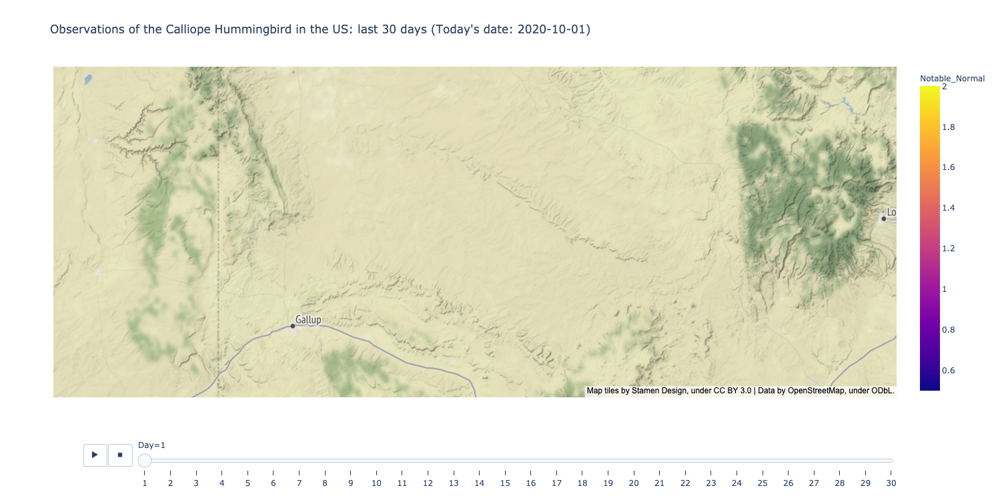

In [56]:
# species_plot = df_species_US.loc[df_species_US["comName"] == f"{species}"]

# Covering US for full 30 days and especially for a single species won't work because you're limited to 10k records. Could be missing a large portion of data.

# US_SPECIES_OBS_df["Notable_Normal"] = US_SPECIES_OBS_df["Notable_Normal"].astype(int)
# TX_SPECIES_OBS_df["Notable_Normal"] = TX_SPECIES_OBS_df["Notable_Normal"].astype(int)

US_SPECIES_OBS_df_animate = US_SPECIES_OBS_df.sort_values(by=["Day"], ignore_index=True)
TX_SPECIES_OBS_df_animate = TX_SPECIES_OBS_df.sort_values(by=["Day"], ignore_index=True)

fig_US_SPECIES_OBS_df = px.scatter_mapbox(
    US_SPECIES_OBS_df_animate,
    lat="lat",
    lon="lng",
    color="Notable_Normal",
    #     color_discrete_sequence="#0000FF",
    size="Bird_Count",
    hover_name="Common_Name",
    hover_data=["Scientific_Name", "Family_Name", "Bird_Count", "Date"],
    title=f"Observations of the {species} in the US: last {days_back_long} days (Today's date: {today})",
    mapbox_style="stamen-terrain",
    width=1000,
    height=750,
    animation_frame="Day",
)

fig_US_SPECIES_OBS_df.add_trace(
    px.scatter_mapbox(
        TX_SPECIES_OBS_df_animate,
        lat="lat",
        lon="lng",
        color="Notable_Normal",
        #         color_discrete_sequence="#8B0000",
        size="Bird_Count",
        hover_name="Common_Name",
        hover_data=["Scientific_Name", "Family_Name", "Bird_Count", "Date"],
        #         animation_frame="Day",
    ).data[0]
)

fig_US_SPECIES_OBS_df.show()

## Notes:
### Data cleaning: 
#### * Renamed columns
#### * Dropped duplicate rows
#### * Dropped unneeded columns
#### * From Date column, created new columns Year, Month, Day, and US_State.
#### * Used .fillna(1) for rows with missing Bird Count data. Filled with a value of "1" since the observation wouldn't have been recorded if there were 0 birds. Also, most observations were of 1 bird.

### Data Sources:
#### * eBird: pulled data from the Notable Observations endpoint and the Taxonomy endpoint. From the Taxonomy data, added the specie's family name to the working dataframe to add to the tooltips on the maps.
#### * Calliope Hummingbird call: https://www.allaboutbirds.org/guide/Calliope_Hummingbird/sounds
#### * WhatBird.com: Range map